## Ejercicio 1: Preparar el ambiente de trabajo

In [1]:
import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report

warnings.simplefilter('ignore')
plt.rcParams['figure.figsize'] = (20,12)
plt.style.use('seaborn')

In [2]:
df = pd.read_csv('breast_cancer.csv').drop(['id','Unnamed: 32'], axis=1)

In [3]:
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [4]:
from sklearn.preprocessing import LabelEncoder

In [5]:
df['diagnosis'] = LabelEncoder().fit_transform(df['diagnosis'])

## Ejercicio 2: Visualizando la distribución de los atributos

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
diagnosis                  569 non-null int32
radius_mean                569 non-null float64
texture_mean               569 non-null float64
perimeter_mean             569 non-null float64
area_mean                  569 non-null float64
smoothness_mean            569 non-null float64
compactness_mean           569 non-null float64
concavity_mean             569 non-null float64
concave points_mean        569 non-null float64
symmetry_mean              569 non-null float64
fractal_dimension_mean     569 non-null float64
radius_se                  569 non-null float64
texture_se                 569 non-null float64
perimeter_se               569 non-null float64
area_se                    569 non-null float64
smoothness_se              569 non-null float64
compactness_se             569 non-null float64
concavity_se               569 non-null float64
concave points_se          569 no

In [7]:
plt.rcParams['figure.figsize'] = (30,200)
from scipy.stats import norm

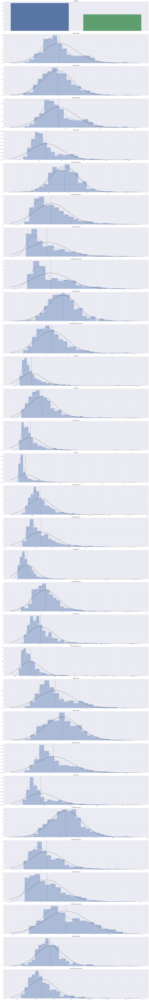

In [8]:
for index , (colname,serie) in enumerate(df.iteritems()):
    plt.subplot(31,1, index+1)
    if pd.api.types.is_float_dtype(serie) is True:
        sns.distplot(serie,fit =norm)
        plt.axvline(np.mean(serie), color='slategrey')
    elif pd.api.types.is_integer_dtype(serie) is True:
        sns.countplot(serie)
    plt.title(colname, fontsize=16)
    plt.xlabel(''); plt.ylabel('');plt.tight_layout()

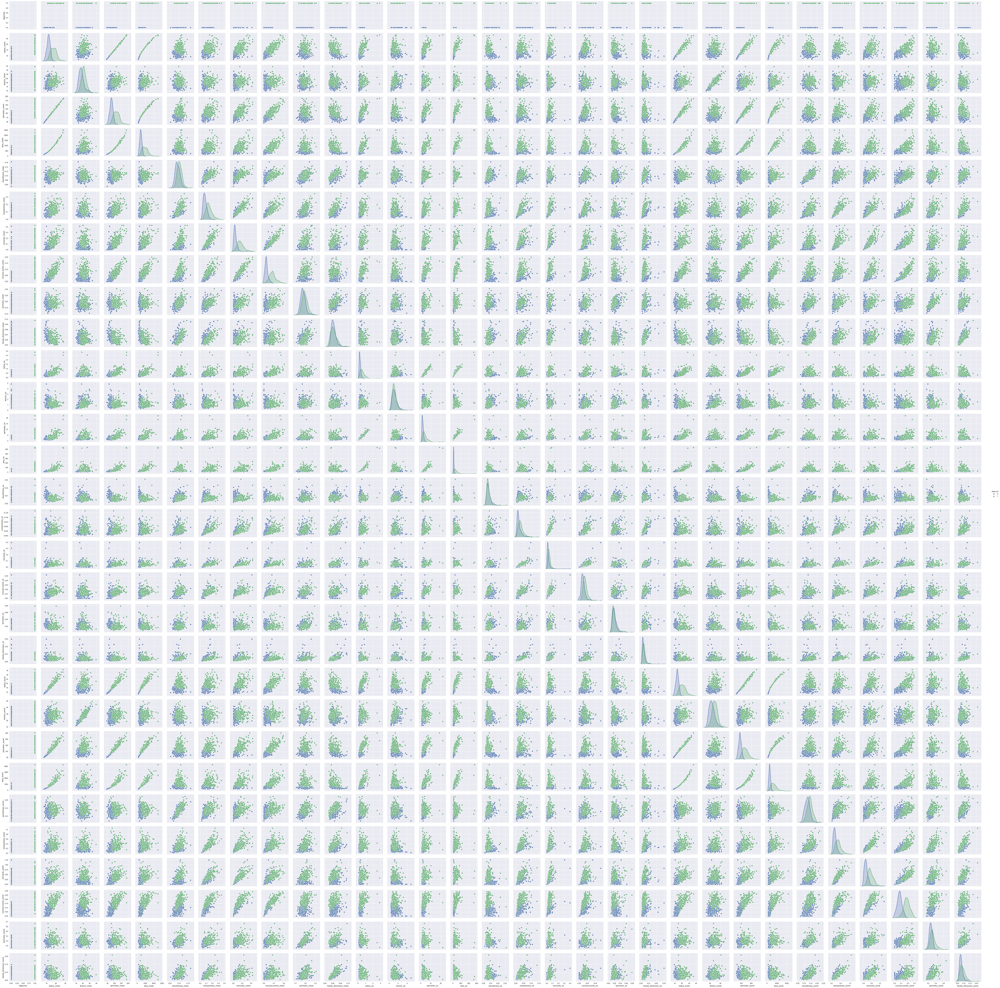

In [9]:
#generar histogramas
sns.pairplot(df, hue='diagnosis')

Se verifica una gran cantidad de overlap en la mayoria de la data, por ejemplo fracal_dimension_mean casi no posee independencia  
Otro inconveniente es el sesgo en la data en muchos casos el sesgo es alto

## Ejercicio 3: Estimando el porcentaje de overlap en los atributos

In [10]:
df_attri = df.iloc[:,1:]

In [11]:
def histogram_overlap(df, attribute, target, perc=100):
    result = []
    for attribute in attribute:
        # get lower bound
        empirical_lower_bound = np.floor(df[attribute].min())
        # get upper bound
        empirical_upper_bound = np.ceil(df[attribute].max())
        # preserve histograms
        tmp_hist_holder = dict()
        # for each target class
        for unique_value in np.unique(df[target]):
        # get histogram
            tmp, _ = np.histogram(df[df[target] == unique_value][attribute],bins=perc,range=[empirical_lower_bound, empirical_upper_bound])
            # append to dict
            tmp_hist_holder["h_"+str(unique_value)] = tmp
        get_minima = np.minimum(tmp_hist_holder["h_1"], tmp_hist_holder["h_0"])
        intersection = np.true_divide(np.sum(get_minima),np.sum(tmp_hist_holder["h_0"]))
        result.append(intersection)
    return result

In [12]:
porcent = histogram_overlap(df,df_attri.columns,'diagnosis')

In [13]:
overlap = pd.DataFrame(list(zip(df_attri.columns,porcent))).sort_values(by=1, ascending=False)

In [14]:
overlap

,0,1
19,fractal_dimension_se,0.593838
14,smoothness_se,0.591036
9,fractal_dimension_mean,0.588235
18,symmetry_se,0.568627
11,texture_se,0.549020
15,compactness_se,0.523810
4,smoothness_mean,0.521008
8,symmetry_mean,0.509804
17,concave points_se,0.507003
29,fractal_dimension_worst,0.492997


Con esta funcion nos permite calcular el overlap de la data, con eso vemos que es un problema dado que vemos datos muy dificiles de diferenciar grupos claros

## Ejercicio 4: Selección del modelo por GridSearchCV

In [15]:
c_param_range= [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]
gamma_param_range = [0.0000001, 0.0001, 0.001, 0.01, 0.1, 1, 10]
param_grid = {'C': c_param_range, 'gamma' : gamma_param_range}

In [16]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler

In [17]:
X_scaled = StandardScaler().fit_transform(df_attri)
X_train , X_test, y_train , y_test  = train_test_split(X_scaled,df['diagnosis'], random_state = 11238,test_size=0.33)

In [18]:
grid = GridSearchCV(SVC(kernel='rbf'),param_grid,cv = 10)

In [19]:
model = grid.fit(X_train,y_train)

In [20]:
model.best_params_

{'C': 100, 'gamma': 0.0001}

Encontramos la mejor combinacion de hiperparametros ronda en un costo de `100` y un gamma de `0.0001`

In [21]:
model.cv_results_.keys()

dict_keys(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time', 'param_C', 'param_gamma', 'params', 'split0_test_score', 'split1_test_score', 'split2_test_score', 'split3_test_score', 'split4_test_score', 'split5_test_score', 'split6_test_score', 'split7_test_score', 'split8_test_score', 'split9_test_score', 'mean_test_score', 'std_test_score', 'rank_test_score', 'split0_train_score', 'split1_train_score', 'split2_train_score', 'split3_train_score', 'split4_train_score', 'split5_train_score', 'split6_train_score', 'split7_train_score', 'split8_train_score', 'split9_train_score', 'mean_train_score', 'std_train_score'])

In [22]:
mean_score = model.cv_results_.get('mean_test_score').reshape(7,8)

Text(0.5, 1.0, 'Accuracy Heatmap')

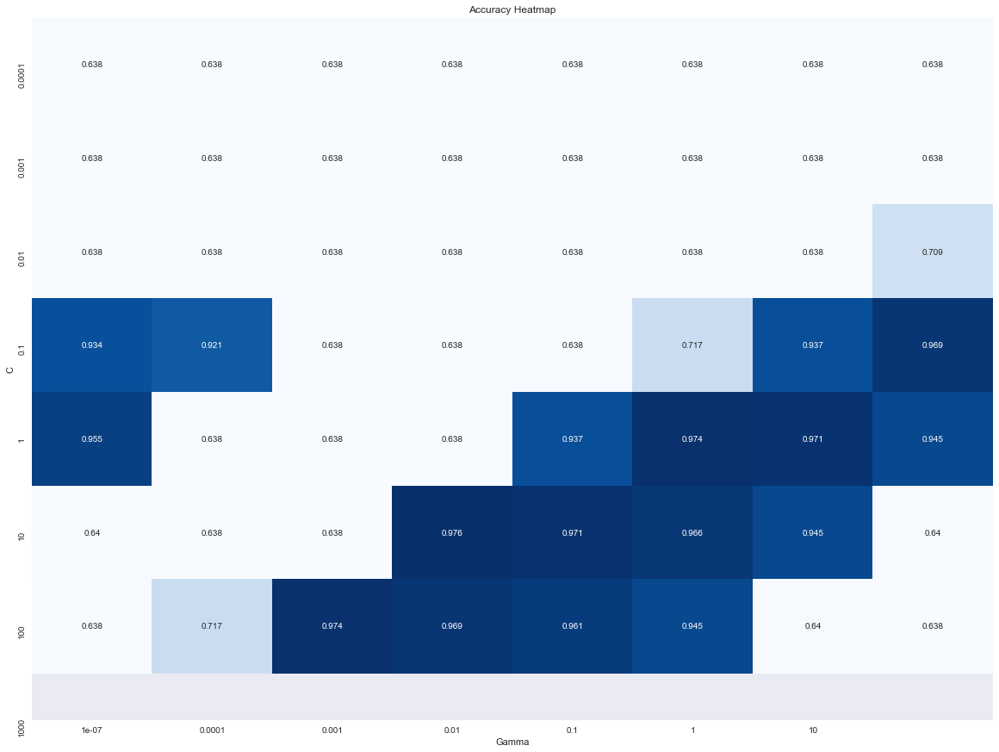

In [23]:
plt.rcParams['figure.figsize'] = (20,15)
sns.heatmap(mean_score,annot=True,cmap='Blues', cbar=False,xticklabels=gamma_param_range, yticklabels=c_param_range, fmt='.3')
plt.xlabel('Gamma')
plt.ylabel('C')
plt.title('Accuracy Heatmap')

## Ejercicio 5: Validación del modelo en el hold-out sample

In [24]:
y_hat = model.predict(X_test)

In [25]:
print(classification_report(y_test,y_hat))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       114
           1       0.99      0.95      0.97        74

   micro avg       0.97      0.97      0.97       188
   macro avg       0.98      0.97      0.97       188
weighted avg       0.97      0.97      0.97       188



El modelo presenta un desempeño bastante alto, discrimina de manera bastante bien cada resultado

# Depuración de atributos

In [45]:
df_overlap = df.loc[:,['symmetry_worst','texture_mean','texture_worst','compactness_mean','compactness_worst','perimeter_se','radius_se','concavity_worst','area_se','radius_mean','concavity_mean','area_mean','perimeter_mean','concave points_worst','concave points_mean','radius_worst','perimeter_worst','area_worst']]

In [52]:
X_scaled_over = StandardScaler().fit_transform(df_overlap)
X_train_over , X_test_over, y_train_over , y_test_over = train_test_split(X_scaled_over,df['diagnosis'], random_state = 11238,test_size=0.33)

In [53]:
grid = GridSearchCV(SVC(kernel='rbf'),param_grid,cv = 10)

In [55]:
model_over = grid.fit(X_train_over,y_train_over)

In [56]:
model_over.best_params_

{'C': 100, 'gamma': 0.001}

In [51]:
y_hat_over = model.predict(X_test_over)
print(classification_report(y_test_over,y_hat))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       114
           1       0.96      0.96      0.96        74

   micro avg       0.97      0.97      0.97       188
   macro avg       0.97      0.97      0.97       188
weighted avg       0.97      0.97      0.97       188

